### 1. Setup Libraries & device

In [1]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from tqdm.notebook import tqdm

In [2]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
device = torch.device(device)
print(device)

cuda:0


### 2. Configure data locations

In [3]:
data_dir = os.path.join("/kaggle", "input", "cityscapes-image-pairs", "cityscapes_data")
train_dir = os.path.join(data_dir, "train") 
val_dir = os.path.join(data_dir, "val")

train_fns = os.listdir(train_dir)
val_fns = os.listdir(val_dir)
print(len(train_fns), len(val_fns))

2975 500


### 3. Analyze data

/kaggle/input/cityscapes-image-pairs/cityscapes_data/train/1269.jpg


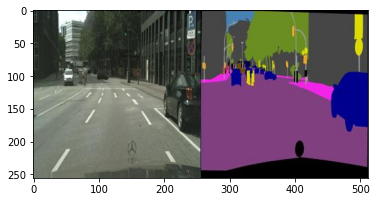

In [4]:
sample_image_fp = os.path.join(train_dir, train_fns[0])
sample_image = Image.open(sample_image_fp).convert("RGB")
plt.imshow(sample_image)
print(sample_image_fp)

### 4. Extract Image and Labels

The input images contain both the road scene and the corresponding label in the same image. Thus, we are splitting it and presenting it as two separate entities.

In [5]:
def split_image(image):
  image = np.array(image)
  cityscape, label = image[:, :256, :], image[:, 256:, :]
  return cityscape, label

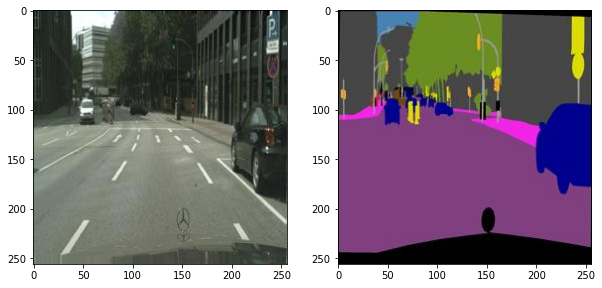

In [6]:
sample_image = np.array(sample_image)
cityscape, label = split_image(sample_image)

# display split images
cityscape, label = Image.fromarray(cityscape), Image.fromarray(label)
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].imshow(cityscape)
axes[1].imshow(label)

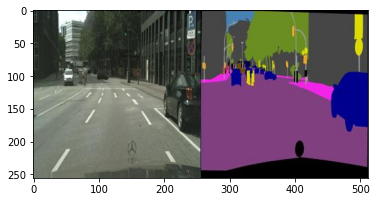

In [7]:
plt.imshow(sample_image)

### 5. Define Labels

We use K-means clustering to segregate the objects of different colors and assign them class labels.   

In [8]:
num_items = 1000
color_array = np.random.choice(range(256), 3*num_items).reshape(-1,3)
print(color_array.shape)

(1000, 3)


In [9]:
num_classes = 10
label_model = KMeans(n_clusters = num_classes)
label_model.fit(color_array)

KMeans(n_clusters=10)

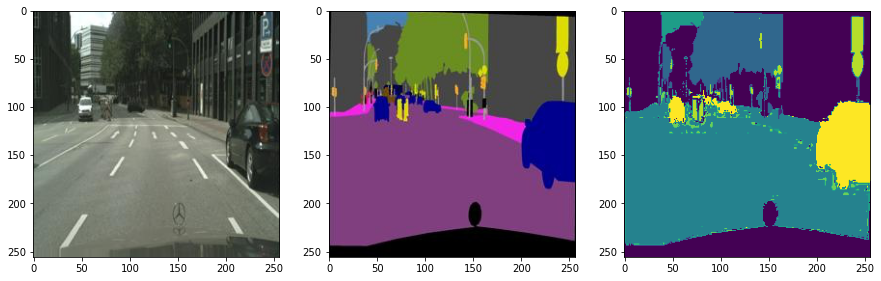

In [10]:
cityscape, label = split_image(sample_image)
label_class = label_model.predict(label.reshape(-1,3)).reshape(256,256)
fig, axes = plt.subplots(1,3,figsize=(15,5))
axes[0].imshow(cityscape)
axes[1].imshow(label)
axes[2].imshow(label_class)

In [11]:
label_class

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [12]:
label_class.shape

(256, 256)

### 6. Define Dataset

In [13]:
class CityscapeDataset(Dataset):

  def __init__(self, image_dir, label_model):
    self.image_dir = image_dir
    self.image_fns = os.listdir(image_dir)
    self.label_model = label_model

  def __len__(self):
    return len(self.image_fns)
  
  def __getitem__(self, index):
    image_fn = self.image_fns[index]
    image_fp = os.path.join(self.image_dir, image_fn)
    image = Image.open(image_fp).convert("RGB")
    image = np.array(image)
    cityscape, label = self.split_image(image)
    label_class = self.label_model.predict(label.reshape(-1,3)).reshape(256,256)
    label_class = torch.Tensor(label_class).long()
    cityscape = self.transform(cityscape)
    return cityscape, label_class

  def split_image(self, image):
    image = np.array(image)
    cityscape, label = image[:, :256, :], image[:, 256:, :]
    return cityscape, label
  
  def transform(self, image):
    transform_ops = transforms.Compose([
                                        transforms.ToTensor(),
                                        transforms.Normalize(mean=(0.485, 0.56, 0.406), std=(0.229, 0.224, 0.225))
    ])
    return transform_ops(image)

In [14]:
dataset = CityscapeDataset(train_dir, label_model)
print(len(dataset))

2975


In [15]:
cityscape, label_class = dataset[0]
print(cityscape.shape, label_class.shape)

torch.Size([3, 256, 256]) torch.Size([256, 256])


### 7. Define Model 


** The Default UNET Model**

In [16]:
class UNet(nn.Module):
    
    def __init__(self, num_classes):
        super(UNet, self).__init__()
        self.num_classes = num_classes
        self.contracting_11 = self.conv_block(in_channels=3, out_channels=64)
        self.contracting_12 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_21 = self.conv_block(in_channels=64, out_channels=128)
        self.contracting_22 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_31 = self.conv_block(in_channels=128, out_channels=256)
        self.contracting_32 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_41 = self.conv_block(in_channels=256, out_channels=512)
        self.contracting_42 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.middle = self.conv_block(in_channels=512, out_channels=1024)
        self.expansive_11 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_12 = self.conv_block(in_channels=1024, out_channels=512)
        self.expansive_21 = nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_22 = self.conv_block(in_channels=512, out_channels=256)
        self.expansive_31 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_32 = self.conv_block(in_channels=256, out_channels=128)
        self.expansive_41 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_42 = self.conv_block(in_channels=128, out_channels=64)
        self.output = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=3, stride=1, padding=1)
        
    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def forward(self, X):
        contracting_11_out = self.contracting_11(X) # [-1, 64, 256, 256]
        contracting_12_out = self.contracting_12(contracting_11_out) # [-1, 64, 128, 128]
        contracting_21_out = self.contracting_21(contracting_12_out) # [-1, 128, 128, 128]
        contracting_22_out = self.contracting_22(contracting_21_out) # [-1, 128, 64, 64]
        contracting_31_out = self.contracting_31(contracting_22_out) # [-1, 256, 64, 64]
        contracting_32_out = self.contracting_32(contracting_31_out) # [-1, 256, 32, 32]
        contracting_41_out = self.contracting_41(contracting_32_out) # [-1, 512, 32, 32]
        contracting_42_out = self.contracting_42(contracting_41_out) # [-1, 512, 16, 16]
        middle_out = self.middle(contracting_42_out) # [-1, 1024, 16, 16]
        expansive_11_out = self.expansive_11(middle_out) # [-1, 512, 32, 32]
        expansive_12_out = self.expansive_12(torch.cat((expansive_11_out, contracting_41_out), dim=1)) # [-1, 1024, 32, 32] -> [-1, 512, 32, 32]
        expansive_21_out = self.expansive_21(expansive_12_out) # [-1, 256, 64, 64]
        expansive_22_out = self.expansive_22(torch.cat((expansive_21_out, contracting_31_out), dim=1)) # [-1, 512, 64, 64] -> [-1, 256, 64, 64]
        expansive_31_out = self.expansive_31(expansive_22_out) # [-1, 128, 128, 128]
        expansive_32_out = self.expansive_32(torch.cat((expansive_31_out, contracting_21_out), dim=1)) # [-1, 256, 128, 128] -> [-1, 128, 128, 128]
        expansive_41_out = self.expansive_41(expansive_32_out) # [-1, 64, 256, 256]
        expansive_42_out = self.expansive_42(torch.cat((expansive_41_out, contracting_11_out), dim=1)) # [-1, 128, 256, 256] -> [-1, 64, 256, 256]
        output_out = self.output(expansive_42_out) # [-1, num_classes, 256, 256]
        return output_out

In [17]:
model = UNet(num_classes=num_classes)

In [18]:
data_loader = DataLoader(dataset, batch_size = 4)
print(len(dataset), len(data_loader))

X, Y = iter(data_loader).next()
print(X.shape, Y.shape)

2975 744
torch.Size([4, 3, 256, 256]) torch.Size([4, 256, 256])


In [19]:
Y_pred = model(X)
print(Y_pred.shape)

torch.Size([4, 10, 256, 256])


### 8. Train the model

In [20]:
batch_size = 16

epochs = 1
lr = 0.01

In [21]:
dataset = CityscapeDataset(train_dir, label_model)
data_loader = DataLoader(dataset, batch_size = batch_size)

In [22]:
model = UNet(num_classes = num_classes).to(device)

In [23]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)

In [24]:
step_losses = []
epoch_losses = []

for epoch in tqdm(range(epochs)):
  epoch_loss = 0
  for X,Y in tqdm(data_loader, total=len(data_loader), leave = False):
    X, Y = X.to(device), Y.to(device)
    optimizer.zero_grad()
    Y_pred = model(X)
    loss = criterion(Y_pred, Y)
    loss.backward()
    optimizer.step()
    epoch_loss += loss.item()
    step_losses.append(loss.item())
  epoch_losses.append(epoch_loss/len(data_loader))

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/186 [00:00<?, ?it/s]

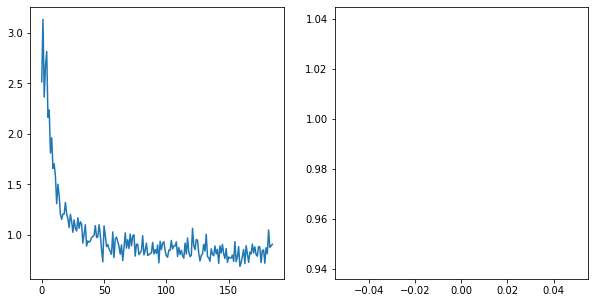

In [25]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
axes[0].plot(step_losses)
axes[1].plot(epoch_losses)

In [26]:
model_name = "U-Net.pth"
torch.save(model.state_dict(), model_name)

### 9. Check model predictions

In [27]:
model_path = "/kaggle/working/U-Net.pth"
model_ = UNet(num_classes=num_classes).to(device)
model_.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [28]:
test_batch_size = 10
dataset = CityscapeDataset(val_dir, label_model)
data_loader = DataLoader(dataset, batch_size=test_batch_size)

In [29]:
X,Y = next(iter(data_loader))
X,Y = X.to(device), Y.to(device)
Y_pred = model_(X)
print(Y_pred.shape)
Y_pred = torch.argmax(Y_pred, dim=1)
print(Y_pred.shape)

torch.Size([10, 10, 256, 256])
torch.Size([10, 256, 256])


In [30]:
inverse_transform = transforms.Compose([
    transforms.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225))
])

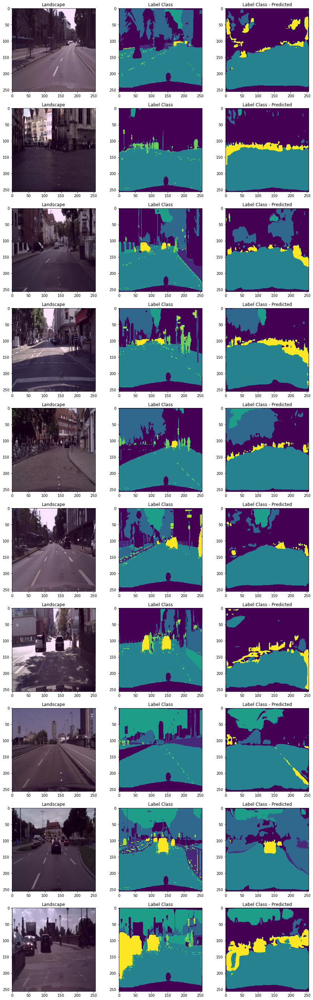

In [31]:
fig, axes = plt.subplots(test_batch_size, 3, figsize=(3*5, test_batch_size*5))

iou_scores = []
label_class_1=[]
label_class_predicted_1=[]
for i in range(test_batch_size):
    
    landscape = inverse_transform(X[i]).permute(1, 2, 0).cpu().detach().numpy()
    label_class = Y[i].cpu().detach().numpy()
    label_class_1.append(label_class)
    
    label_class_predicted = Y_pred[i].cpu().detach().numpy()
    label_class_predicted_1.append(label_class_predicted)
    
    # IOU score
    intersection = np.logical_and(label_class, label_class_predicted)
    union = np.logical_or(label_class, label_class_predicted)
    iou_score = np.sum(intersection) / np.sum(union)
    iou_scores.append(iou_score)

    axes[i, 0].imshow(landscape)
    axes[i, 0].set_title("Landscape")
    axes[i, 1].imshow(label_class)
    axes[i, 1].set_title("Label Class")
    axes[i, 2].imshow(label_class_predicted)
    axes[i, 2].set_title("Label Class - Predicted")

In [32]:
print(sum(iou_scores) / len(iou_scores))

0.7237864849889191


Score after removing Skip Connections

In [33]:
import gc
torch.cuda.empty_cache()
gc.collect()

116

**Doing Abalation Study where we remove the skip conns from the original U net arch and see what effect it has on the Segmentations**

**Instead of concatenating the O/P of 2 blocks in normal skip conns we just do it sequentially**

In [34]:
class UNetwoskipconn(nn.Module):
    
    def __init__(self, num_classes):
        super(UNetwoskipconn, self).__init__()
        self.num_classes = num_classes
        self.contracting_11 = self.conv_block(in_channels=3, out_channels=64)
        self.contracting_12 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_21 = self.conv_block(in_channels=64, out_channels=128)
        self.contracting_22 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_31 = self.conv_block(in_channels=128, out_channels=256)
        self.contracting_32 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_41 = self.conv_block(in_channels=256, out_channels=512)
        self.contracting_42 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.middle = self.conv_block(in_channels=512, out_channels=1024)
        self.expansive_11 = nn.ConvTranspose2d(in_channels=1024, out_channels=512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_12 = self.conv_block(in_channels=512, out_channels=256)
        self.expansive_21 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_22 = self.conv_block(in_channels=128, out_channels=64)
        self.expansive_31 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_32 = self.conv_block(in_channels=32, out_channels=16)
        self.expansive_41 = nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_42 = self.conv_block(in_channels=8, out_channels=64)
        self.output = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=3, stride=1, padding=1)
        
    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block
    
    def forward(self, X):
        contracting_11_out = self.contracting_11(X) # [-1, 64, 256, 256]
        contracting_12_out = self.contracting_12(contracting_11_out) # [-1, 64, 128, 128]
        contracting_21_out = self.contracting_21(contracting_12_out) # [-1, 128, 128, 128]
        contracting_22_out = self.contracting_22(contracting_21_out) # [-1, 128, 64, 64]
        contracting_31_out = self.contracting_31(contracting_22_out) # [-1, 256, 64, 64]
        contracting_32_out = self.contracting_32(contracting_31_out) # [-1, 256, 32, 32]
        contracting_41_out = self.contracting_41(contracting_32_out) # [-1, 512, 32, 32]
        contracting_42_out = self.contracting_42(contracting_41_out) # [-1, 512, 16, 16]
        middle_out = self.middle(contracting_42_out) # [-1, 1024, 16, 16]
        expansive_11_out = self.expansive_11(middle_out) # [-1, 512, 32, 32]
        expansive_12_out = self.expansive_12(expansive_11_out) # [-1, 512, 32, 32] -> [-1, 256, 32, 32]
        expansive_21_out = self.expansive_21(expansive_12_out) # [-1, 128, 64, 64]
        expansive_22_out = self.expansive_22(expansive_21_out) # [-1, 128, 64, 64] -> [-1, 64, 64, 64]
        expansive_31_out = self.expansive_31(expansive_22_out) # [-1, 32, 128, 128]
        expansive_32_out = self.expansive_32(expansive_31_out) # [-1, 32, 128, 128] -> [-1, 16, 128, 128]
        expansive_41_out = self.expansive_41(expansive_32_out) # [-1, 8, 256, 256]
        expansive_42_out = self.expansive_42(expansive_41_out) # [-1, 8, 256, 256] -> [-1, 4, 256, 256]
        output_out = self.output(expansive_42_out) # [-1, num_classes, 256, 256]
        return output_out

**Calculating Metrics for the New Case**

In [35]:
import gc
torch.cuda.empty_cache()
gc.collect()

23

In [36]:
def new_model_trainpipe():
    modelnew = UNetwoskipconn(num_classes=num_classes).to(device)
    step_losses = []
    epoch_losses = []
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr = lr)
    for epoch in tqdm(range(epochs)):
      epoch_loss = 0
      for X,Y in tqdm(data_loader, total=len(data_loader), leave = False):
        X, Y = X.to(device), Y.to(device)
        optimizer.zero_grad()
        Y_pred = modelnew(X)
        loss = criterion(Y_pred, Y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        step_losses.append(loss.item())
      epoch_losses.append(epoch_loss/len(data_loader))
    return modelnew,epoch_losses,step_losses

In [37]:
modelnew,epochlosses,step_losses=new_model_trainpipe()

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [38]:
epochlosses,step_losses

([2.4372302722930907],
 [2.4404096603393555,
  2.438136339187622,
  2.437990427017212,
  2.4307966232299805,
  2.438971757888794,
  2.4372196197509766,
  2.442112445831299,
  2.435502290725708,
  2.4369680881500244,
  2.437443494796753,
  2.4405734539031982,
  2.4396049976348877,
  2.4422993659973145,
  2.4375956058502197,
  2.434572696685791,
  2.437542676925659,
  2.4406838417053223,
  2.429785966873169,
  2.4394707679748535,
  2.4390854835510254,
  2.429408550262451,
  2.444592237472534,
  2.4438271522521973,
  2.430232286453247,
  2.4243898391723633,
  2.4372427463531494,
  2.4390599727630615,
  2.437474250793457,
  2.4318768978118896,
  2.433149814605713,
  2.4419682025909424,
  2.437384605407715,
  2.4360179901123047,
  2.4317779541015625,
  2.436568021774292,
  2.440747022628784,
  2.443429470062256,
  2.439788341522217,
  2.440183401107788,
  2.4305672645568848,
  2.442359685897827,
  2.441349506378174,
  2.4377739429473877,
  2.4274649620056152,
  2.4440207481384277,
  2.43505

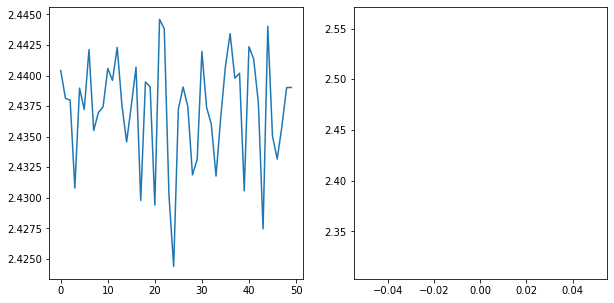

In [39]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
axes[0].plot(step_losses)
axes[1].plot(epochlosses)

In [40]:
import gc
torch.cuda.empty_cache()
gc.collect()

84625

torch.Size([10, 10, 256, 256])
torch.Size([10, 256, 256])
0.6197453316687188


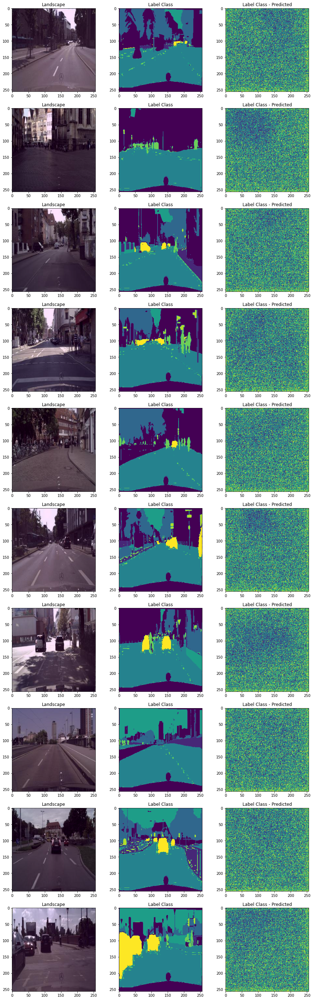

In [41]:
model_name = "U-Net2.pth"
torch.save(modelnew.state_dict(), model_name)
model_path = "/kaggle/working/U-Net2.pth"
model2_ = UNetwoskipconn(num_classes=num_classes).to(device)
model2_.load_state_dict(torch.load(model_path))
fig, axes = plt.subplots(test_batch_size, 3, figsize=(3*5, test_batch_size*5))
Y_pred = model2_(X)
print(Y_pred.shape)
Y_pred = torch.argmax(Y_pred, dim=1)
print(Y_pred.shape)
iou_scores = []
label_class_2=[]
label_class_predicted_2=[]
for i in range(test_batch_size):
    
    landscape = inverse_transform(X[i]).permute(1, 2, 0).cpu().detach().numpy()
    label_class = Y[i].cpu().detach().numpy()
    label_class_predicted = Y_pred[i].cpu().detach().numpy()
    
    # IOU score
    intersection = np.logical_and(label_class, label_class_predicted)
    union = np.logical_or(label_class, label_class_predicted)
    iou_score = np.sum(intersection) / np.sum(union)
    iou_scores.append(iou_score)
    label_class_2.append(label_class)
    label_class_predicted_2.append(label_class_predicted)
    axes[i, 0].imshow(landscape)
    axes[i, 0].set_title("Landscape")
    axes[i, 1].imshow(label_class)
    axes[i, 1].set_title("Label Class")
    axes[i, 2].imshow(label_class_predicted)
    axes[i, 2].set_title("Label Class - Predicted")   
print(sum(iou_scores) / len(iou_scores))

The Model is peforming significantlly worser than the previous Model The ROI scores for the prev. model was 0.72 and for the model without Skip Conn. is 0.61

The Problem with the Above Method is that it doesn't take into account the spatial spaces that's why it is getting such high accuracy for the above tasks::
Here is the new implementation of the correct approach

In [55]:
def compute_union_and_intersect(array1,array2):
    intersect=0
    union=0
    for i,j in zip(array1.reshape(-1),array2.reshape(-1)):
        if i==j:
            intersect+=1
            union+=1
        else:
            union+=2
    return intersect/union
    

In [56]:
lst=[compute_union_and_intersect(i,j) for i,j in zip(label_class_1,label_class_predicted_1)]

In [57]:
miou_1=sum(lst)/len(lst)

In [58]:
lst=[compute_union_and_intersect(i,j) for i,j in zip(label_class_2,label_class_predicted_2)]

In [59]:
miou_2=sum(lst)/len(lst)

In [60]:
print(f'the miou reimplemented for Unit with Skip Connections is{miou_1} and without skip connections is{miou_2}')

the miou reimplemented for Unit with Skip Connections is0.581696639396676 and without skip connections is0.05517092708809805


***Setting up CLIP with Imagenet pre trained weights and observing on different Images***

CLIP

In [1]:
import torch
device='cuda' if torch.cuda.is_available() else 'cpu'

In [2]:
import time
from PIL import Image
import random
import glob
import statistics

In [3]:
from torchvision.models import resnet50 ,ResNet50_Weights

In [4]:
resnet50_pretrained=resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 147MB/s] 


In [5]:
resnet50_imagenet=resnet50_pretrained

In [23]:
import os

In [22]:
! pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-kaxmh1il
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-kaxmh1il
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done


In [24]:
import clip

In [25]:
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [26]:
resnet50_clip_dtype_32=clip.load(clip.available_models()[0],device='cpu')

In [27]:
resnet50_clip_dtype_16=clip.load(clip.available_models()[0],device=device)

In [28]:
weight=ResNet50_Weights.IMAGENET1K_V1

In [29]:
def resnet_50_eval(model,image):
    resnet50_imagenet.eval()
    weight=ResNet50_Weights.IMAGENET1K_V1
    preprocess=weight.transforms()
    create_single_batch=preprocess(image).unsqueeze(0)
    preds=model(create_single_batch).squeeze(0).softmax(0)
    values,indices=preds.topk(5)
    for value,index in zip(values,indices):
        print(f"{weight.meta['categories'][index]:>16s}:{100*value.item():.2f}%")

**Observing ImageNet with Resnet on a sample Image**

In [13]:
resnet_50_eval(resnet50_imagenet,Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01484850/n01484850_1199.JPEG'))

great white shark:99.95%
     tiger shark:0.04%
      hammerhead:0.00%
        sturgeon:0.00%
          dugong:0.00%


https://opus.nci.org.au/display/DAE/ImageNet+Classification+Hierarchy

This Page states that ImageNet contains about 1000 sub categories. While the Whole imagenet Dataset contains 27 high level categories and 21k sub categories==> WHile the organism set has the most no. of sub-categories according to the above Link and it is then divided into categories like person,animals ,fungi,plant etc. and they are further divided into other categories .likewise They are other large categories such as Natural Object , Artifact,beverage,geological formation and etc.




SynSet contains the set of 1 or more synonyms that are interchangable in some context while the Truth is not changed for the propostion in which they are embedded. 

Imagenet defination==>
 Each meaningful concept in WordNet, possibly described by multiple words or word phrases, is called a "synonym set" or "synset". There are more than 100,000 synsets in WordNet; the majority of them are nouns (80,000+). In ImageNet, we aim to provide on average 1000 images to illustrate each synset.Thus we have 1000 classes which are essentially synsets 
 
 
 Essentially for say 1 synset we have a category of Dogs and say there are dogs that look like wolves or Dogs and it's indistinguishable by the humans say for the sake of purpose we have defined it as a dog. if a human is confused then what can we expect from a CV system . Thus it's not good to label all the starking differences in 1 cateogry.
 

For eg. In Animal as the above example we have for eg. a Dog they there could be differences in whether they are stationery or running or there is a size like Bulldog ,pug

for eg. in Table cat. a table could be made of Wood or Glass or it's shape might be different like for eg. round vs rectangular .

For eg. in a Scene for a beach it could accompany a lot of people or no people or there might be different temp. conditions

In [30]:
resnet50_clip_dtype_32[0].to(device)

CLIP(
  (visual): ModifiedResNet(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
     

In [31]:
def clip_image_prediction(resnet50_clip,image):
    preprocess=resnet50_clip[1]
    #model_v=visual_enc
    #model_t=text_enc
    image_inputs=preprocess(image).unsqueeze(0).to(device)
    text_inputs=torch.cat([clip.tokenize(f"a photo of a {c}" for c in weight.meta['categories'])]).to(device)
    with torch.no_grad():
        image_features=resnet50_clip[0].encode_image(image_inputs)
        text_features=resnet50_clip[0].encode_text(text_inputs)
    image_features/=image_features.norm(dim=-1,keepdim=True)
    
    text_features/=text_features.norm(dim=-1,keepdim=True)
    #print(image_features.shape,text_features.shape)
    similarity=(100.0*image_features@text_features.T).softmax(dim=-1)
    values,indices=similarity[0].topk(5)
    print("\n Top Predicitions:\n")
    for value,index in zip(values,indices):
        print(f"{weight.meta['categories'][index]:>16s}:{100*value.item():.2f}%")
    

In [16]:
clip_image_prediction(resnet50_clip_dtype_32,Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01440764/n01440764_10043.JPEG'))



 Top Predicitions:

           tench:99.92%
            coho:0.02%
        goldfish:0.01%
European gallinule:0.00%
        lakeside:0.00%


Since the Image was extracted from the cat of n01440764 which matches the above category also

In [28]:
clip_image_prediction(resnet50_clip_dtype_32,Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01484850/n01484850_1199.JPEG'))


 Top Predicitions:

great white shark:60.39%
        sturgeon:16.81%
     tiger shark:15.64%
      grey whale:1.63%
      hammerhead:1.26%


In [34]:
clip_image_prediction(resnet50_clip_dtype_32,Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03444034/n03444034_11'))


 Top Predicitions:

      snowmobile:49.21%
         go-kart:19.76%
   motor scooter:19.54%
           moped:3.65%
        tricycle:1.45%


In [35]:
resnet_50_eval(resnet50_imagenet,Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03444034/n03444034_11052.JPEG'))

      sports car:19.60%
           racer:11.84%
         go-kart:8.94%
        bearskin:5.77%
         bobsled:3.73%


Again the Test Run which it was ran for the Above Examples matches the Category from where the Image came

In [32]:
!wget https://gist.github.com/aaronpolhamus/964a4411c0906315deb9f4a3723aac57/archive/aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1.zip

--2024-04-23 17:46:42--  https://gist.github.com/aaronpolhamus/964a4411c0906315deb9f4a3723aac57/archive/aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1.zip
Resolving gist.github.com (gist.github.com)... 140.82.113.3
Connecting to gist.github.com (gist.github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/gist/964a4411c0906315deb9f4a3723aac57/zip/aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1 [following]
--2024-04-23 17:46:42--  https://codeload.github.com/gist/964a4411c0906315deb9f4a3723aac57/zip/aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1
Resolving codeload.github.com (codeload.github.com)... 140.82.114.10
Connecting to codeload.github.com (codeload.github.com)|140.82.114.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: 'aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1.zip.1'

aa66dd9dbf6b56649fa     [ <=>                ]  12.76K  --.-KB/s    in 0.01s   

2024-04

In [33]:
import zipfile
with zipfile.ZipFile('/kaggle/working/aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1.zip', 'r') as zip_ref:
    zip_ref.extractall('./keytoixmapping')

In [34]:
def resnet_50_eval_reimagined(model,image,label):
    resnet50_imagenet.eval()
    weight=ResNet50_Weights.IMAGENET1K_V1
    preprocess=weight.transforms()
    create_single_batch=preprocess(image).unsqueeze(0)
    preds=model(create_single_batch).squeeze(0).softmax(0)
    values,indices=preds.topk(5)
    #for value,index in zip(values,indices):
     #   break
        #print(f"{weight.meta['categories'][index]:>16s}:{100*value.item():.2f}%")
    pred_val=''
    kk=[weight.meta['categories'][index] for index in indices]
    if label in kk:
        pred_val='correctpred'
    else:
        pred_val='wrongpred'
    return pred_val
def clip_image_prediction_reimagined(resnet50_clip,image,label):
    preprocess=resnet50_clip[1]
    #model_v=visual_enc
    #model_t=text_enc
    image_inputs=preprocess(image).unsqueeze(0).to(device)
    text_inputs=torch.cat([clip.tokenize(f"a photo of a {c}" for c in weight.meta['categories'])]).to(device)
    with torch.no_grad():
        image_features=resnet50_clip[0].encode_image(image_inputs)
        text_features=resnet50_clip[0].encode_text(text_inputs)
    image_features/=image_features.norm(dim=-1,keepdim=True)
    
    text_features/=text_features.norm(dim=-1,keepdim=True)
    #print(image_features.shape,text_features.shape)
    similarity=(100.0*image_features@text_features.T).softmax(dim=-1)
    values,indices=similarity[0].topk(5)
    #print("\n Top Predicitions:\n")
    for value,index in zip(values,indices):
     #   break
        print(f"{weight.meta['categories'][index]:>16s}:{100*value.item():.2f}%")
        break
    pred_val=''
    kk=[weight.meta['categories'][index] for index in indices]
    if label in kk:
        pred_val='correctpred'
    else:
        pred_val='wrongpred'
    return pred_val

In [58]:
zz=os.listdir('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n04285008')

In [60]:
zz1=[os.path.join('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n04285008/',i) for i in zz]

In [61]:
resnet_preds=[resnet_50_eval_reimagined(resnet50_imagenet,Image.open(i),'sports_car') for i in zz1]

In [62]:
resnet_preds_imagenet=resnet_preds

In [63]:
resnet_preds

['wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred']

In [64]:
clip_preds=[clip_image_prediction_reimagined(resnet50_clip_dtype_32,Image.open(i),'go-kart') for i in zz1]

In [65]:
clip_preds

['wrongpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'correctpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'correctpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'wrongpred',
 'wrongpred',
 'wrongpred',
 'wrongpred']

zz1

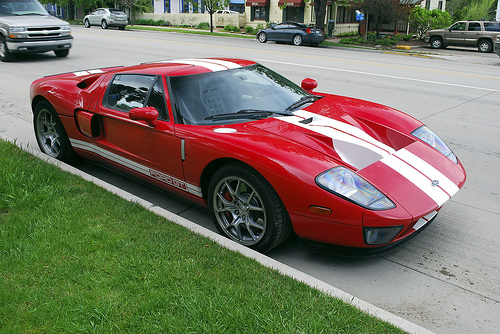

In [67]:
Image.open(zz1[0])

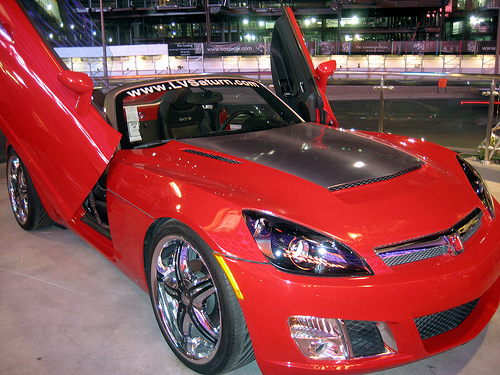

In [68]:
Image.open(zz1[5])

On the Above 2 Images the CLIP model performs better than Resnet with Imagenet .For the class cateogry n04285008 sports-car

In [35]:
def check_preds(cat,label):
    zz=os.listdir(f'/kaggle/input/imagenetmini-1000/imagenet-mini/train/{cat}')
    zz1=[os.path.join(f'/kaggle/input/imagenetmini-1000/imagenet-mini/train/{cat}/',i) for i in zz]
    resnet_preds=[resnet_50_eval_reimagined(resnet50_imagenet,Image.open(i),label) for i in zz1]
    clip_preds=[clip_image_prediction_reimagined(resnet50_clip_dtype_32,Image.open(i),label) for i in zz1]
    return resnet_preds,clip_preds,zz1

In [83]:
check_preds('n03417042','garbage truck')

(['correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred'],
 ['correctpred',
  'correctpred',
  'correctpred',
  'wrongpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'wrongpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'wrongpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  

In the Above Example for class cateogry n03417042 garbage truck we see that for All Images Resnet Imagenet is giving Correct preds and for some iamges Clip is going wrong preds

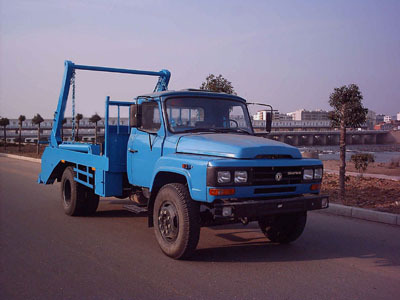

In [85]:
Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03417042/n03417042_201.JPEG')

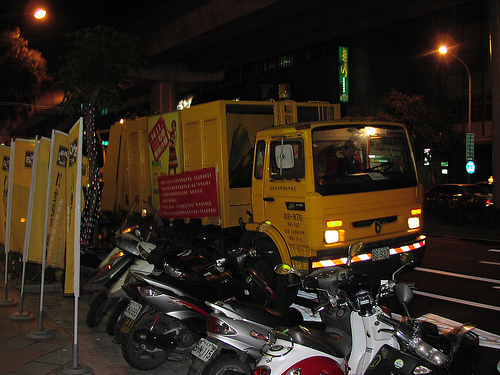

In [86]:
Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03417042/n03417042_11486.JPEG')

In the 2 above Images The Clip fails

In [84]:
check_preds('n03796401','moving van')

(['correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'wrongpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'correctpred',
  'wrongpred'],
 ['correctpred',
  'correctpred',
  'correctpred',
  'correctpred',


In this cateogry n03796401 moving Van 2 images are being incorrectly classified by Resnet Imagenet and More than 2 Images are being incorrectly classified by Clip

Some eg. given below are for images

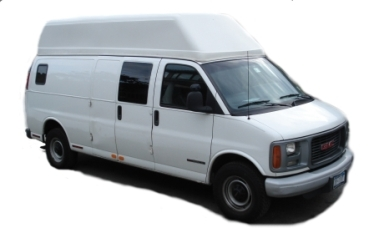

In [87]:
Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03796401/n03796401_9572.JPEG')

Clip performs worse on these

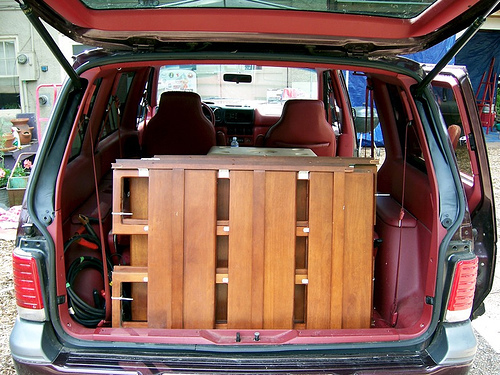

In [89]:
Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03796401/n03796401_4181.JPEG')

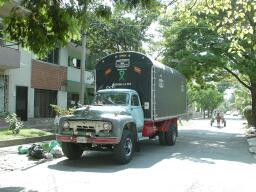

In [90]:
Image.open('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n03796401/n03796401_10243.JPEG')

In [36]:
a,b,c=check_preds('n03977966','police van')

       ambulance:31.51%
      police van:77.96%
      police van:81.64%
      police van:76.89%
      police van:95.82%
      police van:55.44%
         minibus:72.68%
      police van:31.04%
         minibus:47.85%
      police van:98.00%
      police van:99.23%
          pickup:47.13%
      police van:85.47%
      police van:66.96%
      police van:81.03%
      police van:69.18%
      police van:24.13%
      police van:35.78%
      police van:99.54%
      police van:98.29%
      police van:98.83%
      police van:98.37%
      police van:82.98%
      police van:56.16%
       ambulance:50.16%


In [38]:
b

['correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred']

In [39]:
a

['correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'wrongpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred',
 'correctpred']

In [50]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']

In [51]:
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']

In [52]:
lst_b

[]

In [53]:
lst_a

[11]

In the Above Class n03977966 Police van we see that for 1 image we have a wrong Pred by Rn.Imagenet and All correct preds by Clip

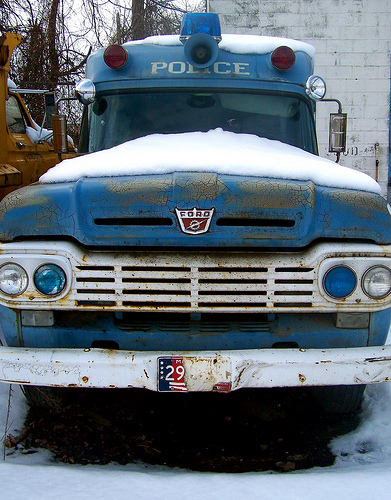

In [55]:
Image.open(c[11])

In [62]:
a,b,c=check_preds('n04252077','snowmobile')

      snowmobile:99.36%
      snowmobile:98.15%
      snowmobile:92.90%
      snowmobile:93.88%
      snowmobile:97.57%
      snowmobile:95.85%
      snowmobile:95.16%
      snowmobile:79.60%
      snowmobile:49.33%
      snowmobile:88.55%
      snowmobile:92.75%
      snowmobile:74.97%
      snowmobile:82.45%
      snowmobile:95.79%
      snowmobile:87.83%
      snowmobile:97.97%
      snowmobile:96.70%
      snowmobile:78.74%
         dogsled:20.98%
      snowmobile:97.50%
      snowmobile:90.47%
      disk brake:31.62%
      snowmobile:98.48%
      snowmobile:82.85%
      snowmobile:97.97%
      snowmobile:94.81%
             ski:38.64%
      snowmobile:95.60%
      snowmobile:96.96%
      snowmobile:99.47%
      snowmobile:97.00%
      snowmobile:97.07%
      snowmobile:99.23%
      snowmobile:89.46%
      snowmobile:58.09%
      snowmobile:90.30%


In [63]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']

In [64]:
lst_a,lst_b

([], [21])

For the Above Category n04252077 Snow Mobile We have 1 Pred were we are able to get 1 wrong prediction at the CLIP model . The respective Image is

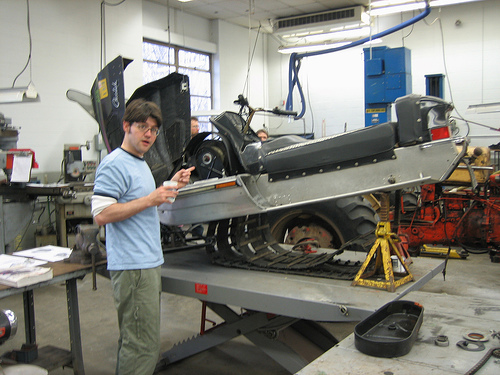

In [65]:
Image.open(c[21])

In [67]:
a,b,c=check_preds('n02066245','grey whale')

      grey whale:18.05%
      grey whale:70.88%
            coho:24.75%
      grey whale:46.39%
       submarine:36.09%
      grey whale:92.24%
      grey whale:83.63%
leatherback turtle:75.77%
      grey whale:34.77%
      grey whale:72.44%
    killer whale:73.01%
      grey whale:67.89%
      grey whale:37.51%
      grey whale:86.27%
      grey whale:30.83%
      grey whale:68.16%
       albatross:44.66%
leatherback turtle:46.80%
    killer whale:48.61%
      grey whale:91.23%
      grey whale:86.80%
      grey whale:90.28%
      grey whale:55.42%
      grey whale:90.23%
      grey whale:72.77%
      grey whale:46.53%
      grey whale:83.86%
      grey whale:94.63%
       speedboat:22.37%
      grey whale:90.68%
         sandbar:26.92%
      grey whale:89.21%
      grey whale:76.55%
      grey whale:50.77%
      grey whale:53.62%
leatherback turtle:60.93%
      grey whale:97.02%
      grey whale:40.94%
      grey whale:96.56%
    killer whale:64.41%
      grey whale:91.10%
      grey

In [68]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']
lst_a,lst_b

([53], [46])

FOr the the next class n02066245 Grey Whale we have 2 images where one is wrongly predicted for resnet and the other is wrongly predicted for CLIP

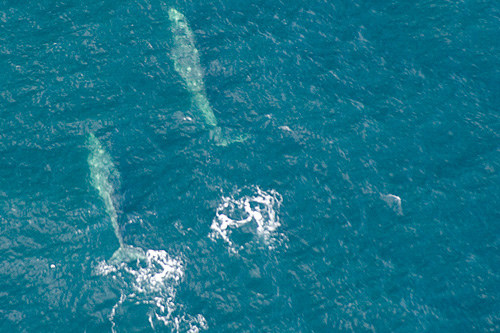

In [70]:
Image.open(c[53])

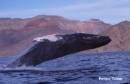

In [71]:

Image.open(c[46])

In [72]:
a,b,c=check_preds('n03272010','electric guitar')

 electric guitar:29.77%
           swing:5.02%
 electric guitar:31.04%
 electric guitar:78.28%
 electric guitar:90.41%
 electric guitar:82.03%
 electric guitar:86.40%
 electric guitar:65.41%
 electric guitar:98.38%
 electric guitar:25.04%
 electric guitar:91.78%
 electric guitar:90.95%
 electric guitar:93.23%
 electric guitar:45.52%
 electric guitar:86.15%
 electric guitar:92.00%
           stage:21.24%
     rock beauty:12.66%
 electric guitar:52.67%
 electric guitar:95.10%
 electric guitar:96.09%
 electric guitar:82.46%
 electric guitar:48.30%
 electric guitar:72.46%
            oboe:35.80%
 electric guitar:28.66%
 electric guitar:65.86%
           stage:31.97%
 electric guitar:97.72%
 electric guitar:98.07%
 electric guitar:50.48%
 electric guitar:83.28%


In [73]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']
lst_a,lst_b

([17], [1, 16, 17])

For the next Class n03272010 and Electric Guitar We have 1 Image where only 1 image is incorrectly predicted by Resnet and 3 Images is Incorrectly predicted by Clip

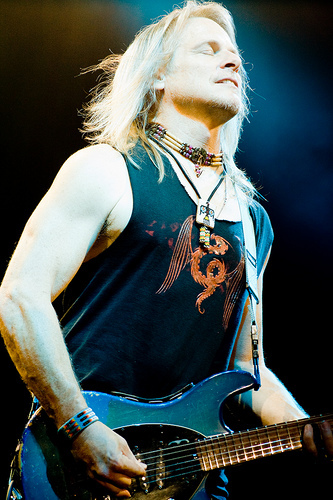

In [74]:
Image.open(c[17])

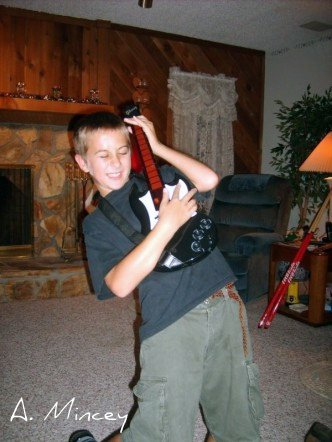

In [75]:
Image.open(c[1])

In [76]:
a,b,c=check_preds('n07718747','artichoke')

         cardoon:30.83%
       artichoke:75.57%
       artichoke:87.26%
          sorrel:38.36%
       artichoke:89.30%
       artichoke:98.17%
       artichoke:72.09%
         cardoon:58.71%
       artichoke:60.79%
       artichoke:38.83%
       artichoke:53.45%
       artichoke:90.13%
         cardoon:91.16%
   custard apple:77.24%
             pot:4.46%
       artichoke:68.15%
       artichoke:54.81%
   custard apple:57.45%
       artichoke:92.65%
         cardoon:67.15%
       artichoke:74.97%
         cardoon:35.45%
       artichoke:71.07%
       artichoke:76.17%
       artichoke:61.55%
       artichoke:65.10%
       artichoke:96.61%
       artichoke:94.41%
       artichoke:97.38%
       guacamole:21.47%


In [77]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']
lst_a,lst_b

([], [29])

For the next class n07718747 744 artichoke we have 1 image where the CLip incorrectly classifies 1 image and 

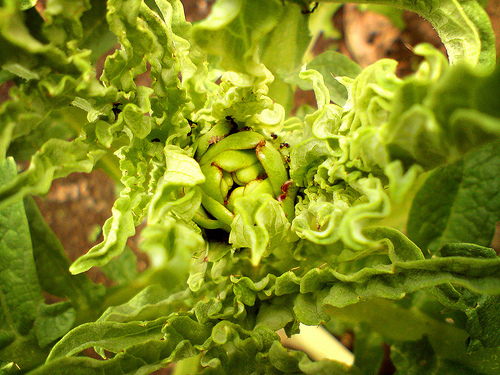

In [78]:
Image.open(c[29])

In [79]:
a,b,c=check_preds('n09229709','bubble')

          bubble:47.61%
            vase:12.36%
          sarong:22.21%
          bubble:97.48%
          bubble:93.41%
      cowboy hat:17.20%
          bubble:99.70%
          bubble:14.55%
           shoji:14.95%
          bubble:53.40%
          bubble:78.84%
          bubble:10.80%
          bubble:76.63%
          grille:29.22%
       washbasin:9.87%
          bubble:98.31%
          bubble:79.99%
 theater curtain:16.14%
          bubble:92.49%
  triumphal arch:11.81%
          bubble:52.75%
          bubble:93.13%
          bubble:64.41%
            titi:12.57%
     loudspeaker:14.05%
          bubble:96.35%
          bubble:88.41%
          bubble:87.40%
          bubble:43.14%
          bubble:99.78%
          bubble:41.36%
          bubble:63.06%
     oxygen mask:35.50%
          bubble:87.10%
          bubble:67.95%
       shoe shop:15.89%
          bubble:99.67%


In [80]:
lst_a=[i for i in range(len(a)) if a[i]=='wrongpred']
lst_b=[i for i in range(len(b)) if b[i]=='wrongpred']
lst_a,lst_b

([5], [2, 5, 8, 13, 17, 19, 23, 24, 35])

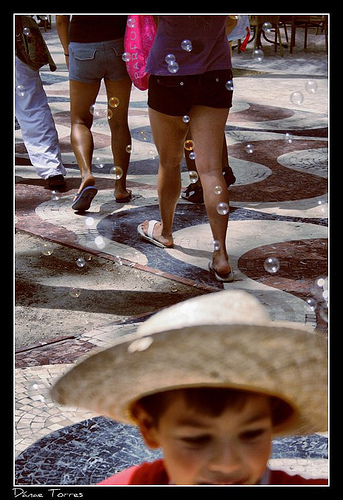

In [81]:
Image.open(c[5])

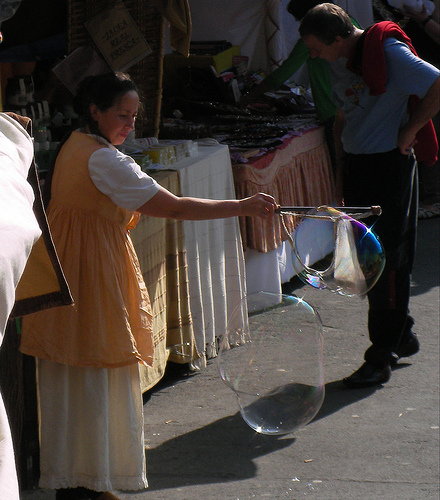

In [82]:
Image.open(c[2])

Q 2.5==>


In [50]:
import pandas as pd
df = pd.read_csv('/kaggle/working/keytoixmapping/964a4411c0906315deb9f4a3723aac57-aa66dd9dbf6b56649fa3fab83659b2acbf3cbfd1/map_clsloc.txt',delimiter=' ')

In [51]:
df.head()

,n02119789,1,kit_fox
0,n02100735,2,English_setter
1,n02110185,3,Siberian_husky
2,n02096294,4,Australian_terrier
3,n02102040,5,English_springer
4,n02066245,6,grey_whale


In [20]:
print(resnet50_clip_dtype_32[0].dtype,resnet50_clip_dtype_16[0].dtype)

torch.float32 torch.float16


In [36]:
#fp16_model=clip.model.convert_weights(resnet50_clipcopy.to(device))

In [109]:
def clip_image_prediction_time(resnet50_clip,image):
    #text_inputs=torch.cat(clip.tokenize(f"a photo of a {c}" for c in weight.meta['categories'])).to(device)
    image_inputs=resnet50_clip[1](Image.open(image)).unsqueeze(0).to(device)
    with torch.no_grad():
        start_time=time.time()
        image_features=resnet50_clip[0].encode_image(image_inputs)
        end_time=time.time()
    return end_time-start_time
        #text_features=resnet50_clip[0].encode_text(text_inputs)
    #image_features/=image_features.norm(dim=-1,keepdim=True)
    #text_features/=text_features.norm(dim=-1,keepdim=True)
    #similarity=(100.0*image_features*text_features.T).softmax(dim=-1)
    #values,indices=similarity[0].topk(1)
    #print("\n Top Predicitions:\n")
    #for value,index in zip(classes,indices):
     #   print(f"{weight.meta['cateogries'][index]:>16s}:{100*value.item():.2f}%")

In [110]:
paths100=[glob.glob('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01440764/*.JPEG')]+[glob.glob('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01443537/*.JPEG')]+[glob.glob('/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01632458/*.JPEG')]

In [111]:
paths101=[]
for i in paths100:
    paths101.extend(i)

In [112]:
time_for_fp32=[]

In [113]:
def timecalculate(modeltype):
    time_for_fp=[]
    for i in paths101:
        time_for_fp.append(clip_image_prediction_time(modeltype,i))
    return time_for_fp

In [114]:
print(resnet50_clip_dtype_16[0].dtype,resnet50_clip_dtype_32[0].dtype)

torch.float16 torch.float32


In [115]:
time_for_fp32=timecalculate(resnet50_clip_dtype_32)

In [116]:
time_for_fp16=timecalculate(resnet50_clip_dtype_16)

In [117]:
m32,std32=statistics.mean(time_for_fp32),statistics.stdev(time_for_fp32)
print(f'for fp 32 the Mean is {m32}and stddev is {std32} ')

for fp 32 the Mean is 0.007270465983022558and stddev is 0.0004141086947348974 


In [118]:
m16,std16=statistics.mean(time_for_fp16),statistics.stdev(time_for_fp16)
print(f'for fp 32 the Mean is {m16}and stddev is {std16} ')

for fp 32 the Mean is 0.007666705858589399and stddev is 0.0008011202483074449 


In [107]:
paths5=['/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01440764/n01440764_10043.JPEG']+['/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01443537/n01443537_10092.JPEG']+['/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01484850/n01484850_1199.JPEG']+['/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01491361/n01491361_10000.JPEG']+['/kaggle/input/imagenetmini-1000/imagenet-mini/train/n01494475/n01494475_10931.JPEG']

In [119]:
def clip_image_prediction_probs(resnet50_clip,image):
    #text_inputs=torch.cat(clip.tokenize(f"a photo of a {c}" for c in weight.meta['categories'])).to(device)
    image_inputs=resnet50_clip[1](Image.open(image)).unsqueeze(0).to(device)
    with torch.no_grad():
        #start_time=time.time()
        image_features=resnet50_clip[0].encode_image(image_inputs)
        #end_time=time.time()
        #text_features=resnet50_clip[0].encode_text(text_inputs)
    image_features/=image_features.norm(dim=-1,keepdim=True)
    #text_features/=text_features.norm(dim=-1,keepdim=True)
    similarity=(100.0*image_features).softmax(dim=-1)
    values,indices=similarity[0].topk(1)
    return (values,indices)
    #print("\n Top Predicitions:\n")
    #for value,index in zip(classes,indices):
     #   print(f"{weight.meta['cateogries'][index]:>16s}:{100*value.item():.2f}%")

In [121]:
def estimate_probs(modeltype):
    time_for_fp=[]
    for i in paths5:
        time_for_fp.append(clip_image_prediction_probs(modeltype,i))
    return time_for_fp

In [122]:
fp16_probs=estimate_probs(resnet50_clip_dtype_16)

In [123]:
fp16_probs

[(tensor([0.7749], device='cuda:0', dtype=torch.float16),
  tensor([47], device='cuda:0')),
 (tensor([0.9980], device='cuda:0', dtype=torch.float16),
  tensor([86], device='cuda:0')),
 (tensor([0.9775], device='cuda:0', dtype=torch.float16),
  tensor([891], device='cuda:0')),
 (tensor([0.9546], device='cuda:0', dtype=torch.float16),
  tensor([466], device='cuda:0')),
 (tensor([0.5151], device='cuda:0', dtype=torch.float16),
  tensor([521], device='cuda:0'))]

In [124]:
fp32_probs=estimate_probs(resnet50_clip_dtype_32)

In [125]:
fp32_probs

[(tensor([0.7862], device='cuda:0'), tensor([47], device='cuda:0')),
 (tensor([0.9982], device='cuda:0'), tensor([86], device='cuda:0')),
 (tensor([0.9777], device='cuda:0'), tensor([891], device='cuda:0')),
 (tensor([0.9551], device='cuda:0'), tensor([466], device='cuda:0')),
 (tensor([0.5157], device='cuda:0'), tensor([521], device='cuda:0'))]

/opt/conda/lib/python3.10/site-packages/torch/profiler/profiler.py:339: UserWarning: Profiler won't be using warmup, this can skew profiler results
  warn("Profiler won't be using warmup, this can skew profiler results")
STAGE:2024-04-12 00:13:15 34:34 ActivityProfilerController.cpp:312] Completed Stage: Warm Up
STAGE:2024-04-12 00:13:16 34:34 ActivityProfilerController.cpp:318] Completed Stage: Collection
STAGE:2024-04-12 00:13:16 34:34 ActivityProfilerController.cpp:322] Completed Stage: Post Processing
STAGE:2024-04-12 00:13:45 34:34 ActivityProfilerController.cpp:312] Completed Stage: Warm Up
STAGE:2024-04-12 00:13:46 34:34 ActivityProfilerController.cpp:318] Completed Stage: Collection
STAGE:2024-04-12 00:13:46 34:34 ActivityProfilerController.cpp:322] Completed Stage: Post Processing


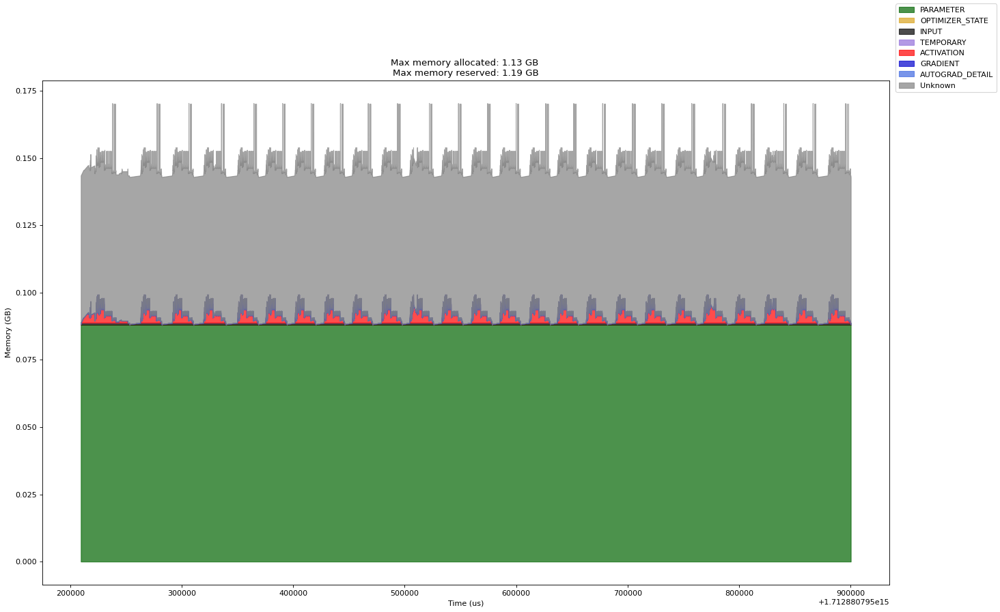

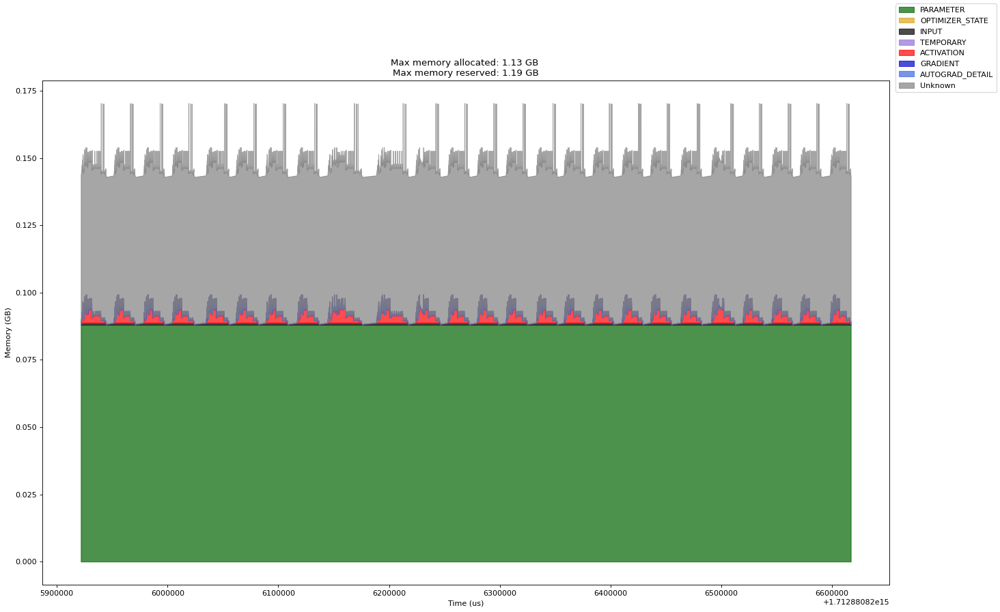

In [130]:
import logging
import socket
from datetime import datetime, timedelta

import torch

from torch.autograd.profiler import record_function
from torchvision import models

logging.basicConfig(
   format="%(levelname)s:%(asctime)s %(message)s",
   level=logging.INFO,
   datefmt="%Y-%m-%d %H:%M:%S",
)
logger: logging.Logger = logging.getLogger(__name__)
logger.setLevel(level=logging.INFO)

TIME_FORMAT_STR: str = "%b_%d_%H_%M_%S"

def trace_handler(prof: torch.profiler.profile):
   # Prefix for file names.
   host_name = socket.gethostname()
   timestamp = datetime.now().strftime(TIME_FORMAT_STR)
   file_prefix = f"{host_name}_{timestamp}"

   # Construct the trace file.
   prof.export_chrome_trace(f"{file_prefix}.json.gz")

   # Construct the memory timeline file.
   prof.export_memory_timeline(f"{file_prefix}.html", device="cuda:0")

def run_resnet50(model,num_iters=5, device="cuda:0"):
    
   
   with torch.profiler.profile(
       activities=[
           torch.profiler.ProfilerActivity.CPU,
           torch.profiler.ProfilerActivity.CUDA,
       ],
       schedule=torch.profiler.schedule(wait=0, warmup=0, active=6, repeat=1),
       record_shapes=True,
       profile_memory=True,
       with_stack=True,
       on_trace_ready=trace_handler,
   ) as prof:
       for _ in range(num_iters):
           prof.step()
           with record_function("## forward ##"):
               pred = estimate_probs(model)
# Warm up
run_resnet50(resnet50_clip_dtype_32)
    # Run the resnet50 model
run_resnet50(resnet50_clip_dtype_32)

STAGE:2024-04-12 00:15:17 34:34 ActivityProfilerController.cpp:312] Completed Stage: Warm Up
STAGE:2024-04-12 00:15:18 34:34 ActivityProfilerController.cpp:318] Completed Stage: Collection
STAGE:2024-04-12 00:15:18 34:34 ActivityProfilerController.cpp:322] Completed Stage: Post Processing
STAGE:2024-04-12 00:15:49 34:34 ActivityProfilerController.cpp:312] Completed Stage: Warm Up
STAGE:2024-04-12 00:15:50 34:34 ActivityProfilerController.cpp:318] Completed Stage: Collection
STAGE:2024-04-12 00:15:50 34:34 ActivityProfilerController.cpp:322] Completed Stage: Post Processing


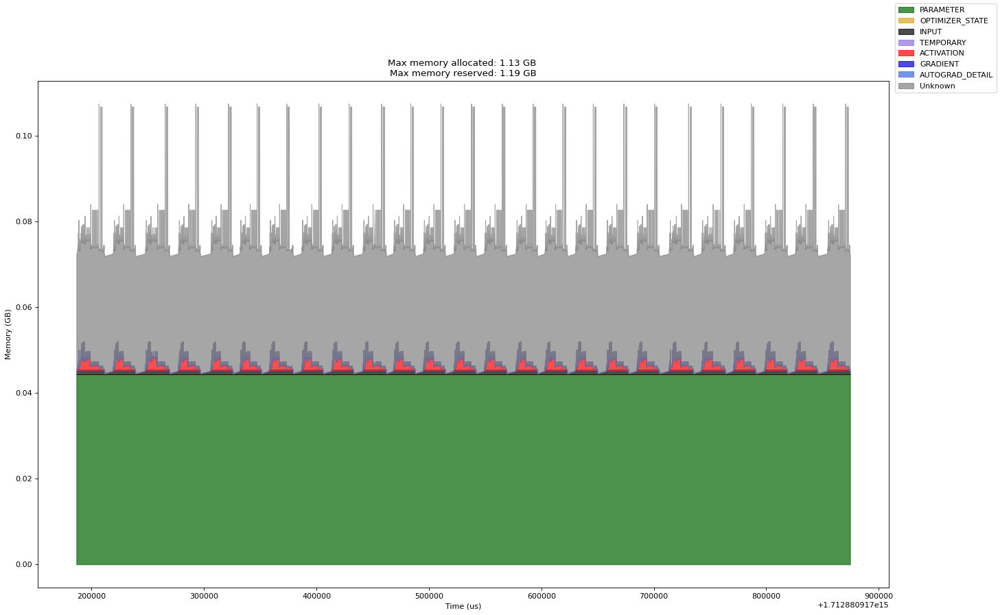

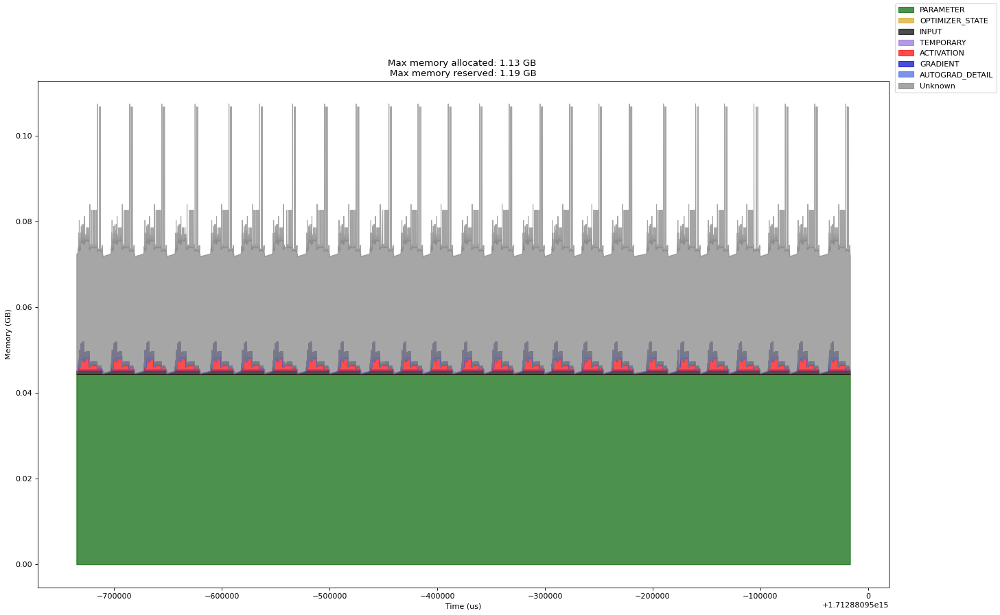

In [131]:
# Warm up
run_resnet50(resnet50_clip_dtype_16)
    # Run the resnet50 model
run_resnet50(resnet50_clip_dtype_16)